<a href="https://colab.research.google.com/github/emirprasovic/dog-vision/blob/main/dog_breed_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End to End Dog Breed Classification Project

This notebook contains an end-to-end multiclass image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem
Identifying a breed of dog based on the image of a dog.
## 2. Data
Kaggle's dog breed identification competition *https://www.kaggle.com/datasets/kabilan03/dogbreedclassification*
## 3. Evaluation
Evaluation is a file that contains the prediction probabilities for each dog breed. For example, if there are 10 dog breeds, the probabilities of these 10 must add up to 100% and the actual prediction is the one with the highest probability.
## 4. Features
There are 120 different dog breeds, meaning we have multiclass classification. The data is the dog images, which means we are working with unstructured data and it's best that we use deep learning or transfer learning.
There are around 10,000+ both tranining (contain labels) and test images (no labels).

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
print(tf.__version__)
print(hub.__version__)

2.19.0
0.16.1


In [ ]:
print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "Not Available")

GPU Available


### Getting Our Data Ready
Now we want to import our data from google drive and turn our data (images) into Tensors.

In [ ]:
labels_csv = pd.read_csv("/content/drive/MyDrive/dog-breed-data/labels.csv")
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

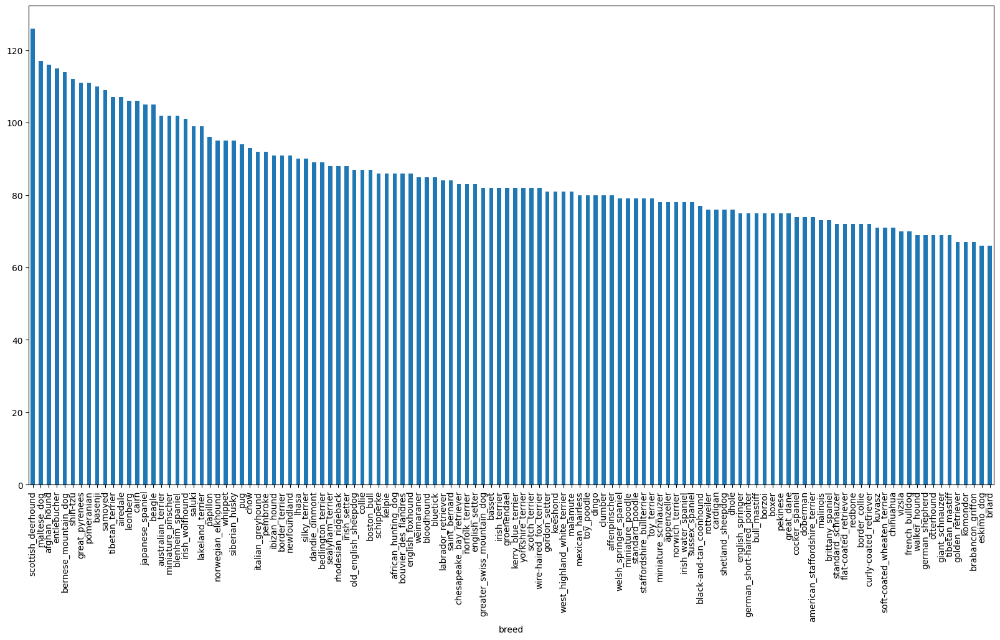

In [ ]:
# How many images do we have per each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

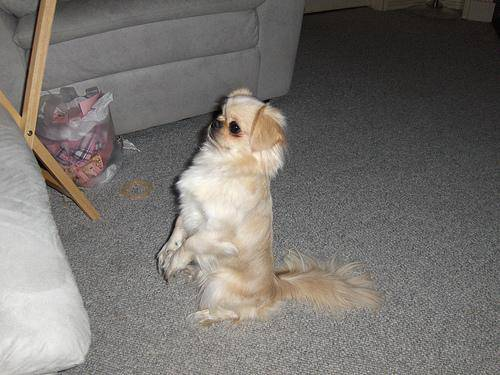

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/dog-breed-data/train/001cdf01b096e06d78e9e5112d419397.jpg")

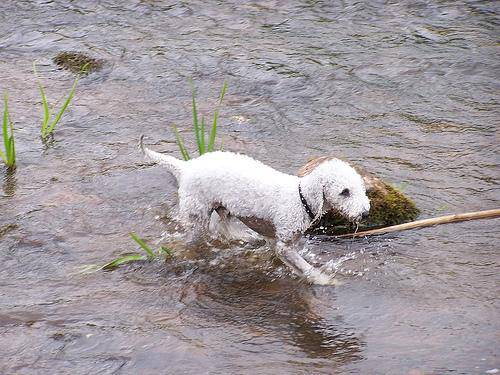

In [ ]:
# Create pathnames from image ID's
image_pathnames = [f"/content/drive/MyDrive/dog-breed-data/train/{id}.jpg" for id in labels_csv["id"]]
Image(image_pathnames[5])

In [ ]:
len(image_pathnames) == len(labels_csv["id"])

True

In [ ]:
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Check if number of labels matches the number of filenames
if (len(labels) == len(image_pathnames)):
  print("Number of labels match the number of pathnames")
else:
  print("Stop execution. Data length mismatch")

Number of labels match the number of pathnames


In [ ]:
unique_labels = np.unique(labels)
len(unique_labels), unique_labels

(120,
 array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter'

In [ ]:
# Turn every label into a boolean array that only has one True value for the matching label
boolean_labels = [label == unique_labels for label in labels]
boolean_labels[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Example: Turning the boolean array into an integer
boolean_labels[0].argmax()

np.int64(19)

## Creating our own validation set
Since we aren't provided with one, we will create one from the test set

In [ ]:
# Set up X and y
X = image_pathnames
y = boolean_labels

print(len(X), len(y))

10222 10222


In [ ]:
# Set the number of images we will use for experimenting (10,000+ will take too long to train)
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Split our data into train and validation sets
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

## Preprocessing Images (turning images into Tensors)

To preprocess our image into tensors, we will use a function that does the following:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our image (jpeg) into Tensors
4. Resize our images to be (224, 224)
5. Return the modified image

array([[[108,  46,   0],
        [152,  92,  42],
        [180, 120,  70],
        ...,
        [176, 144,  69],
        [189, 157,  82],
        [214, 182, 107]],

       [[151,  93,  47],
        [179, 121,  75],
        [167, 111,  64],
        ...,
        [167, 136,  56],
        [172, 139,  60],
        [188, 157,  77]],

       [[151,  98,  56],
        [188, 137,  94],
        [162, 113,  70],
        ...,
        [200, 168,  81],
        [196, 162,  75],
        [200, 168,  81]],

       ...,

       [[189, 122,  69],
        [186, 119,  66],
        [183, 116,  63],
        ...,
        [213, 160, 106],
        [212, 159, 107],
        [209, 156, 102]],

       [[186, 119,  66],
        [184, 117,  64],
        [183, 116,  63],
        ...,
        [197, 145,  88],
        [199, 146,  92],
        [199, 147,  90]],

       [[182, 115,  62],
        [181, 114,  61],
        [183, 116,  63],
        ...,
        [184, 132,  74],
        [190, 138,  81],
        [192, 140,  82]]], dtype=uint8)
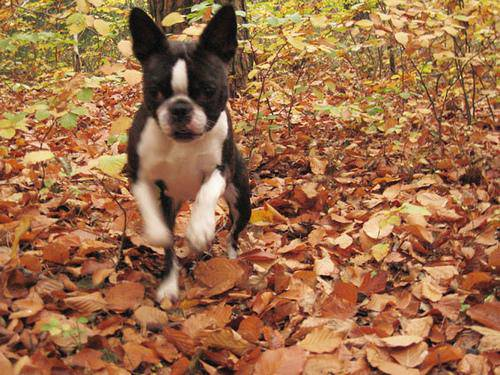

In [ ]:
# Convert image to numpy array
from matplotlib.pyplot import imread
image = imread(image_pathnames[0])
image

In [ ]:
# Turn image to tensor. This means it can be processed with a GPU making it much faster
tf.constant(image)

<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[108,  46,   0],
        [152,  92,  42],
        [180, 120,  70],
        ...,
        [176, 144,  69],
        [189, 157,  82],
        [214, 182, 107]],

       [[151,  93,  47],
        [179, 121,  75],
        [167, 111,  64],
        ...,
        [167, 136,  56],
        [172, 139,  60],
        [188, 157,  77]],

       [[151,  98,  56],
        [188, 137,  94],
        [162, 113,  70],
        ...,
        [200, 168,  81],
        [196, 162,  75],
        [200, 168,  81]],

       ...,

       [[189, 122,  69],
        [186, 119,  66],
        [183, 116,  63],
        ...,
        [213, 160, 106],
        [212, 159, 107],
        [209, 156, 102]],

       [[186, 119,  66],
        [184, 117,  64],
        [183, 116,  63],
        ...,
        [197, 145,  88],
        [199, 146,  92],
        [199, 147,  90]],

       [[182, 115,  62],
        [181, 114,  61],
        [183, 116,  63],
        ...,
        [184, 132,  7

In [ ]:
IMAGE_SIZE = [128, 128]

In [ ]:
def preprocess_image(filename):
  # Read the image
  image = tf.io.read_file(filename)
  # Turn the image into a Tensor with 3 color chanels
  image = tf.image.decode_jpeg(image, channels=3)
  # Normalize image: Convert the colour chanel range from 0-255 to 0-1 (RGB is represented from 0 to 1, not 0 to 255)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize image
  image = tf.image.resize(image, IMAGE_SIZE)

  return image

In [ ]:
image_pathnames[0]

'/content/drive/MyDrive/dog-breed-data/train/000bec180eb18c7604dcecc8fe0dba07.jpg'

In [ ]:
tensor = tf.io.read_file(image_pathnames[0])
tensor = tf.image.decode_jpeg(tensor, channels=3)

In [ ]:
tensor = tf.image.convert_image_dtype(tensor, tf.float32)
tensor

<tf.Tensor: shape=(375, 500, 3), dtype=float32, numpy=
array([[[0.41960788, 0.1764706 , 0.        ],
        [0.5921569 , 0.35686275, 0.16078432],
        [0.69411767, 0.4666667 , 0.27058825],
        ...,
        [0.6862745 , 0.56078434, 0.26666668],
        [0.7411765 , 0.6156863 , 0.32156864],
        [0.8352942 , 0.70980394, 0.4156863 ]],

       [[0.5882353 , 0.36078432, 0.18039216],
        [0.7019608 , 0.47450984, 0.29411766],
        [0.6431373 , 0.43137258, 0.24705884],
        ...,
        [0.654902  , 0.53333336, 0.21960786],
        [0.67058825, 0.54901963, 0.23529413],
        [0.73333335, 0.6117647 , 0.29803923]],

       [[0.5882353 , 0.3803922 , 0.21568629],
        [0.73333335, 0.53333336, 0.3647059 ],
        [0.6313726 , 0.43921572, 0.27058825],
        ...,
        [0.7803922 , 0.65882355, 0.30588236],
        [0.7568628 , 0.63529414, 0.28235295],
        [0.7843138 , 0.6627451 , 0.30980393]],

       ...,

       [[0.7372549 , 0.47450984, 0.25882354],
        [0.72

## Turning our data into batches
Batching our data is important because imagine if we had to process 10,000 images at one time. They may not all fit in memory. That's why we batch them with the default batch size of 32.

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: `(image, label)`

In [ ]:
def get_image_label(filename, label):
  """
  Returns a tuple in the format (image, label). Known as a TensorFlow tuple.
  """
  image = preprocess_image(filename)
  return image, label

In [ ]:
(get_image_label(X[1], y[1]))

(<tf.Tensor: shape=(128, 128, 3), dtype=float32, numpy=
 array([[[0.24633072, 0.17581788, 0.13675298],
         [0.21953031, 0.12761854, 0.07130726],
         [0.28452078, 0.16180062, 0.08017961],
         ...,
         [0.4269345 , 0.26591966, 0.14129758],
         [0.35117307, 0.18997516, 0.06407136],
         [0.2984466 , 0.1763265 , 0.0952948 ]],
 
        [[0.21477436, 0.12499186, 0.07050351],
         [0.22258757, 0.12142167, 0.0628631 ],
         [0.24092612, 0.13432641, 0.06691656],
         ...,
         [0.22265315, 0.13104823, 0.07289752],
         [0.15406136, 0.06179726, 0.01679616],
         [0.1986637 , 0.14169373, 0.10391799]],
 
        [[0.258707  , 0.1352848 , 0.05499986],
         [0.24763353, 0.1352867 , 0.06538781],
         [0.23077658, 0.14058049, 0.07955251],
         ...,
         [0.11851113, 0.0482891 , 0.0183194 ],
         [0.22429846, 0.1542057 , 0.10043468],
         [0.11192723, 0.06979167, 0.054547  ]],
 
        ...,
 
        [[0.661253  , 0.37300572

In [ ]:
BATCH_SIZE = 32

def batch_data(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Takes in the images and labels in case of training and validation data and returns the batched version of the data.
  Shuffles the data if it is training data, but doesn't shuffle validation data.
  """
  # In case of test dataset, we don't have labels
  if test_data:
    print("Creating test data batches...")
    # Create a dataset of filepaths (data) and map it to the preprocessed image and batch data (data_batch)
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(preprocess_image).batch(batch_size)
    return data_batch

  # In case of validation dataset, we don't need to shuffle our data and we have labels
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    # Shuffling pathnames and labels before mapping image preprocessor is faster than doing it after preprocessing image (less data)
    data = data.shuffle(buffer_size=len(X))

    # We map get_image_label because that returns a tuple of an already preprocessed image and the label (img_proc, label)
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

In [ ]:
# Creating training and validation data batches
train_data = batch_data(X_train, y_train)
valid_data = batch_data(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
# Vizualizing data batches

def vizualize_batches(images, labels, num_images=25):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  plt.figure(figsize=(10, 10))

  for i in range(num_images):
    # Create subplots (5 rows, 5 cols)
    ax = plt.subplot(5, 5, i + 1)
    # Display an image
    plt.imshow(images[i])
    # Add the label as the title
    plt.title(unique_labels[labels[i].argmax()])
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[5.69101155e-01, 6.12238407e-01, 7.22042322e-01],
          [5.83471239e-01, 6.26608491e-01, 7.36412406e-01],
          [5.84313750e-01, 6.27451003e-01, 7.37254918e-01],
          ...,
          [6.34252489e-01, 6.81311309e-01, 7.83272147e-01],
          [6.32781863e-01, 6.79840684e-01, 7.81801522e-01],
          [6.33149505e-01, 6.80208325e-01, 7.82169163e-01]],
 
         [[5.63706577e-01, 6.06843829e-01, 7.16647744e-01],
          [5.78998208e-01, 6.22135460e-01, 7.31939375e-01],
          [5.78535974e-01, 6.21673226e-01, 7.31477141e-01],
          ...,
          [6.34905934e-01, 6.81964755e-01, 7.83925593e-01],
          [6.32389784e-01, 6.79448605e-01, 7.81409442e-01],
          [6.29966855e-01, 6.77025676e-01, 7.78986514e-01]],
 
         [[5.68101823e-01, 6.11239076e-01, 7.21042991e-01],
          [5.60792267e-01, 6.03929520e-01, 7.13733435e-01],
          [6.03339493e-01, 6.46476746e-01, 7.56280720e-01],
          ...,
          [6.36044741e-01, 6.83103561e-01, 7.8506

In [ ]:
len(train_images), len(train_labels)

(32, 32)

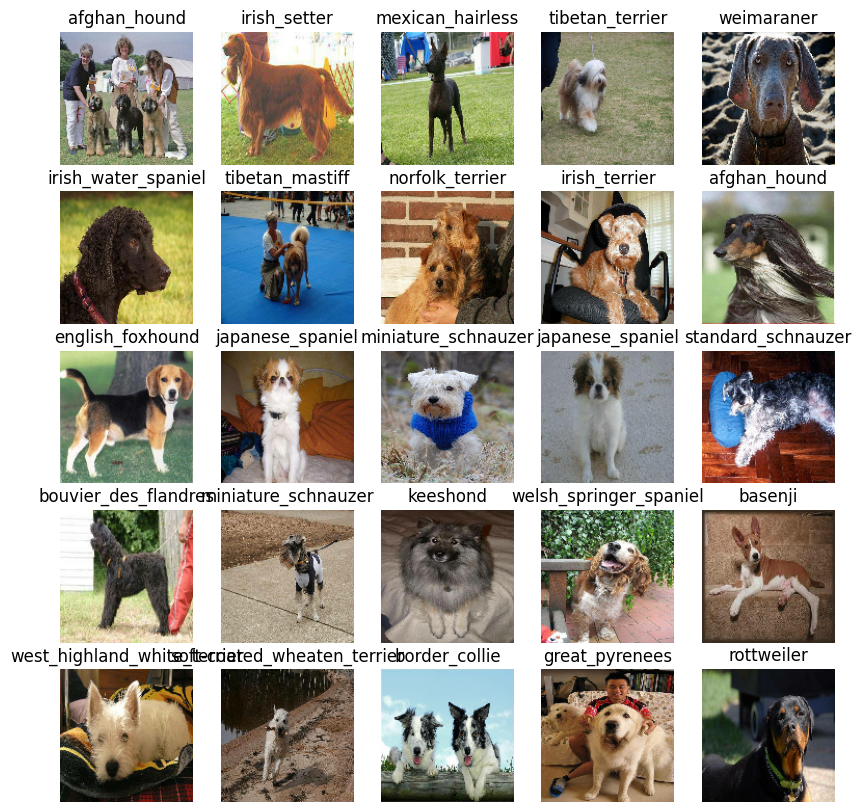

In [ ]:
vizualize_batches(train_images, train_labels)

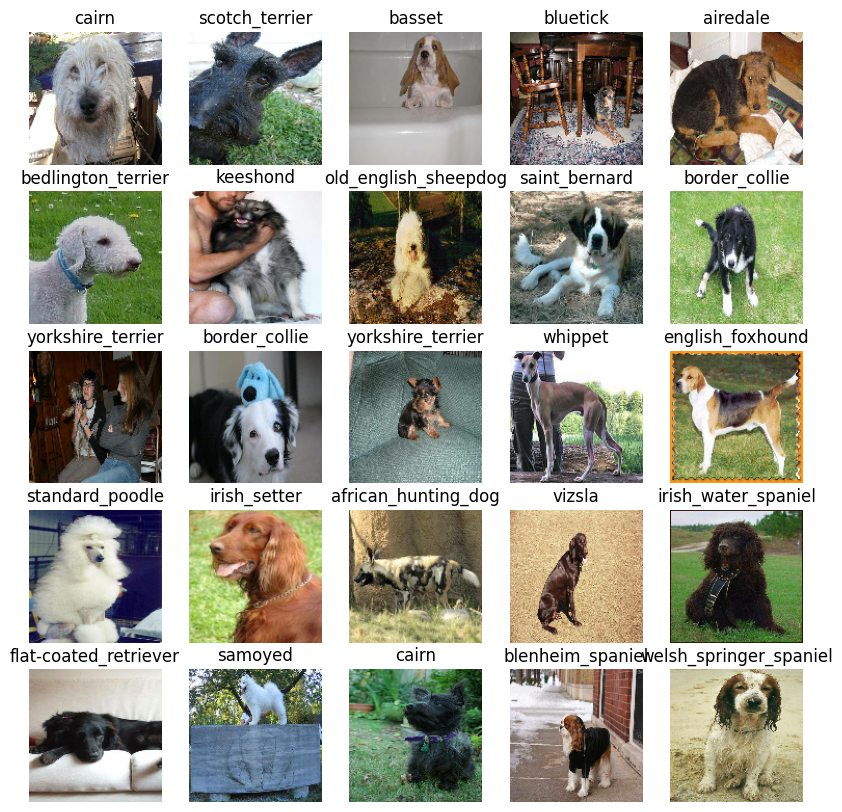

In [ ]:
val_images, val_labels = next(valid_data.as_numpy_iterator())
vizualize_batches(val_images, val_labels)

## Building The Model

Before building the actual model, we need to define the following:
* Input shape (our images in the form of Tensors) of our model
* Output shape of our model
* URL of the model we want to use

In [ ]:
INPUT_SHAPE = [None, IMAGE_SIZE, IMAGE_SIZE, 3] # [batch, height, width, color channels]

OUTPUT_SHAPE = len(unique_labels)

MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2"

In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  hubs_layer = hub.KerasLayer(model_url)

  # Set up the model layers
  model = tf.keras.Sequential([
  tf.keras.layers.Lambda(lambda x: hubs_layer(x)), # Layer 1 (input layer)
  tf.keras.layers.Dense(units=output_shape, # Layer 2 (output layer)
                        activation="softmax") # the activation function is softmax because we have multiclass clf.
  ])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(), # Optimization method (like gradient descent)
      metrics=["accuracy"]
  )

  # Build the model
  model.build(input_shape)

  return model

In [ ]:
model = create_model()
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

### Creating Callbacks

Callbacks are helper functions that a model can use while traning to do things like save its progress, check its progress or stop training if the model stops improving.

In [ ]:
import datetime
import os

# Load TensorBoard extension
%load_ext tensorboard

In [ ]:
# TensorBoard Logging Callback
def create_tensorboard_callback():
  # Create a log directory
  logdir = os.path.join("drive/MyDrive/dog-breed-data/logs",
                        datetime.datetime.now().strftime("%Y%m%d-H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
# Early Stopping Callback (helps stop our model from overfitting)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

## Training Our Model

We will train our model on a smaller subset of data (ex. 1000 records), to make sure everything works as expected.

We also need to define the number of `epochs`, which basically means the number of times our model will go through the images trying to find patterns.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Make sure we are still running on a GPU
print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "Not Available")

GPU Available


In [ ]:
def train_model():
  """
  Train a model and return the trained (fitted) version of it.
  """
  # Create model
  model = create_model()

  # Create new TensorBoard session each time we train the model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

In [ ]:
# Fit the model to the data
model = train_model()

Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 173s 6s/step - accuracy: 0.0267 - loss: 6.1805 - val_accuracy: 0.1150 - val_loss: 4.5764
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - accuracy: 0.3755 - loss: 2.6457 - val_accuracy: 0.1700 - val_loss: 3.7751
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 138ms/step - accuracy: 0.7815 - loss: 1.1102 - val_accuracy: 0.2200 - val_loss: 3.5137
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9559 - loss: 0.5037 - val_accuracy: 0.2200 - val_loss: 3.4954
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 122ms/step - accuracy: 0.9937 - loss: 0.2551 - val_accuracy: 0.2250 - val_loss: 3.4906
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - accuracy: 1.0000 - loss: 0.1659 - val_accuracy: 0.2300 - val_loss: 3.4922
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - accuracy: 1.0000 - loss: 0.1139 - val_accuracy: 0.2250 - val_loss: 3.5246
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - accuracy: 1.0000 - loss: 0.0863 - val_accur

## Checking TensorBoard Logs

The tensorboard magic function `%tensorboard` will access the logs directory we used above and visualize its contents

In [ ]:
%tensorboard --logdir drive/MyDrive/dog-breed-data/logs

<IPython.core.display.Javascript object>

### Making predictions and evaluating them with the trained model

The thing here to note is that we will make predictions on the validation data.

In [ ]:
preds = model.predict(valid_data, verbose=1)
preds

7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 742ms/step


array([[1.2731944e-04, 1.8377354e-02, 2.5033103e-05, ..., 1.4852409e-04,
        1.0061599e-02, 1.8880067e-02],
       [1.0334312e-04, 8.0332378e-05, 2.8823370e-01, ..., 1.9951184e-04,
        1.7824240e-03, 3.1609260e-04],
       [1.8291114e-05, 1.2839715e-03, 1.7932611e-05, ..., 2.1625500e-02,
        1.4399757e-04, 2.1901557e-02],
       ...,
       [5.4632626e-05, 2.5773287e-04, 7.0882414e-04, ..., 3.1568395e-04,
        1.4071226e-04, 4.5702597e-03],
       [1.5686317e-04, 1.3915224e-03, 1.1094182e-06, ..., 1.7775451e-04,
        1.2871300e-05, 5.1443680e-04],
       [2.4161823e-06, 1.7890059e-04, 1.7071710e-04, ..., 1.0148593e-03,
        2.1266369e-03, 3.9387814e-04]], dtype=float32)

In [ ]:
# For each one of the 200 predictions, we have 120 columns that represent the probability for each unique dog breed
preds.shape, len(y_val)

((200, 120), 200)

In [ ]:
np.sum(preds[0]), preds[0]

(np.float32(1.0),
 array([1.27319436e-04, 1.83773544e-02, 2.50331032e-05, 1.22287346e-03,
        3.25033994e-04, 1.35550028e-04, 6.36009546e-03, 1.53102392e-05,
        5.15312604e-05, 6.91136011e-05, 2.65963990e-02, 4.11666464e-04,
        7.99138652e-05, 3.98800548e-05, 7.18198076e-04, 1.14513532e-04,
        5.03933989e-05, 3.29788751e-03, 2.32721935e-03, 1.31886054e-06,
        5.23293857e-04, 1.36353687e-04, 6.63936760e-07, 4.52284189e-03,
        1.59604733e-05, 6.34865282e-05, 1.82952676e-02, 3.10068397e-04,
        2.28071539e-03, 8.83666216e-05, 3.97896743e-04, 5.78521052e-03,
        9.90163418e-04, 4.05146784e-05, 1.77464390e-03, 1.08268589e-03,
        1.25329452e-05, 1.90124490e-06, 4.46426973e-04, 6.28158668e-05,
        4.95896861e-02, 1.05836725e-05, 9.03681066e-05, 2.64032482e-04,
        1.05146226e-03, 1.82252425e-05, 3.12626835e-05, 9.39918027e-05,
        2.64951756e-04, 7.78579924e-05, 1.64946119e-04, 3.92473594e-05,
        1.21105649e-01, 5.49464166e-05, 4.9214

In [ ]:
# For the first prediction
print(f"Max probability for the first prediction is {max(preds[0])}")
print(f"Index of max probability: {np.argmax(preds[0])}")
print(f"Predicted label: {unique_labels[np.argmax(preds[0])]}")


Max probability for the first prediction is 0.30352142453193665
Index of max probability: 82
Predicted label: old_english_sheepdog


In [ ]:
def get_pred_label(prediction_probs):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_labels[np.argmax(prediction_probs)]

test_pred_label = get_pred_label(preds[1])
test_pred_label

'african_hunting_dog'

In [ ]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Since our validation data is still in a batch dataset, we have to unbatch it to make predictions on the validation images and compare those predictions to the validation labels

In [ ]:
def unbatch_dataset(dataset):
  """
  Takes in a BatchDataset and returns the split unbatched version.
  """
  images = []
  labels = []

  for image, label in valid_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[np.argmax(label)])

  return images, labels


In [ ]:
val_images, val_labels = unbatch_dataset(valid_data)
val_images[0], val_labels[0]

(array([[[0.25828475, 0.36198825, 0.24389817],
         [0.39360544, 0.3418826 , 0.30183154],
         [0.8296768 , 0.7504122 , 0.74760556],
         ...,
         [0.8228947 , 0.8611053 , 0.8719636 ],
         [0.76902866, 0.8160875 , 0.8079686 ],
         [0.8183106 , 0.82737565, 0.84341663]],
 
        [[0.30484715, 0.29425842, 0.2039199 ],
         [0.4352226 , 0.37971696, 0.31883615],
         [0.8593526 , 0.80739874, 0.77293175],
         ...,
         [0.85530514, 0.89059925, 0.917223  ],
         [0.80846506, 0.8516023 , 0.8737746 ],
         [0.7754192 , 0.8053707 , 0.84239584]],
 
        [[0.75496686, 0.6921665 , 0.66526437],
         [0.807427  , 0.804948  , 0.7710658 ],
         [0.9814564 , 0.9935267 , 0.971697  ],
         ...,
         [0.91192657, 0.94484705, 0.9793709 ],
         [0.8952671 , 0.9312506 , 0.98800606],
         [0.8093318 , 0.85525966, 0.91700304]],
 
        ...,
 
        [[0.45503026, 0.4585416 , 0.41656855],
         [0.5492001 , 0.5392863 , 0.49725

In [ ]:
def plot_prediction(prediction_probs, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probs[n], labels[n], images[n]

  # Get the label of our prediction
  pred_label = get_pred_label(pred_prob)

  color = ""
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Plot image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  plt.title(f"Prediction: {pred_label} ({(np.max(pred_prob) * 100):.1f}%) Actual: {true_label}",
            color=color)

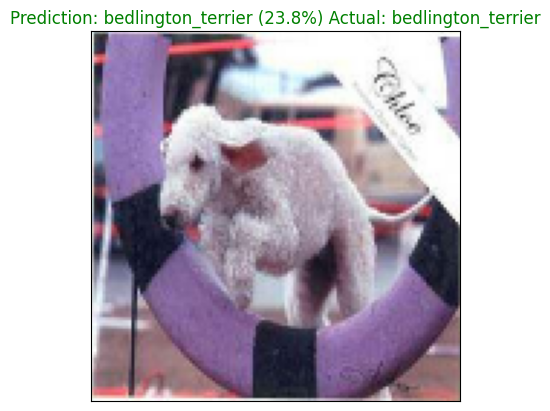

In [ ]:
plot_prediction(preds, val_labels, val_images, n=54)

In [ ]:
def plot_top_10_predictions(prediction_probs, labels, n=1):
  """
  Plot the top 10 highest predictions along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probs[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_labels[top_10_pred_indexes]

  # Set up plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
            labels=top_10_pred_labels,
            rotation="vertical")

  # Change the color of the true label
  if (np.isin(true_label, top_10_pred_labels)):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [ ]:
preds[0][preds[0].argsort()[-10:][::-1]]

array([0.30352142, 0.12110565, 0.11497358, 0.07263613, 0.06072565,
       0.04958969, 0.03475661, 0.0265964 , 0.01888007, 0.01837735],
      dtype=float32)

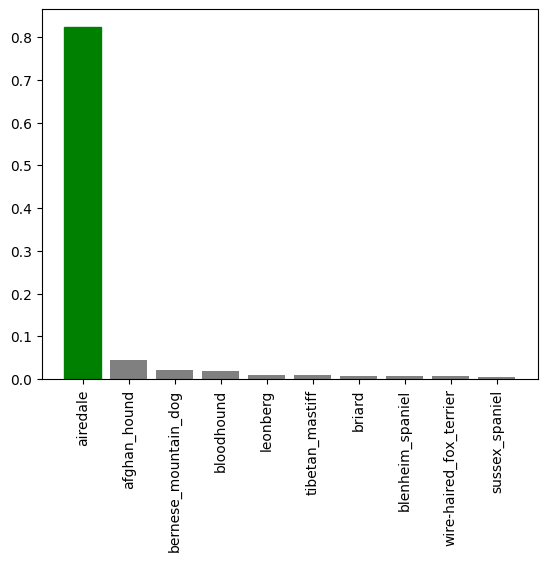

In [ ]:
plot_top_10_predictions(preds, val_labels, n=4)

### Saving and Reloading a Trained Model

In [ ]:
def save_model(model, suffix=None):
  """
  Save a model into the /models directory and appends a suffix if specified
  """
  # Create model directory
  modeldir = os.path.join("drive/My Drive/dog-breed-data/models", datetime.datetime.now().strftime("%Y%m%d-H%M%s"))
  model_path = modeldir + "-" + suffix + ".keras"

  model.save(model_path)
  return model_path

In [ ]:
import keras
# Disable deserialization since our model contains a lambda layer
keras.config.enable_unsafe_deserialization()

def load_model(model_path):
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
model_path = save_model(model, "1000-img")
model_path

'drive/My Drive/dog-breed-data/models/20251003-H281759516085-1000-img.keras'

In [ ]:
loaded_model = load_model(model_path)
loaded_model

<Sequential name=sequential_1, built=True>

## Training our Model on the entire dataset

In [ ]:
len(X), len(y), len(X_train), len(y_train)

(10222, 10222, 800, 800)

In [ ]:
# Create a data batch with full dataset
full_data = batch_data(X, y)
full_data

Creating training data batches...


<_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a new model
full_model = create_model()

In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=2)

In [ ]:
# Fit the model
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

save_model(full_model, suffix="full-model-mobilenetv2")

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 1568s 5s/step - accuracy: 0.2179 - loss: 3.7790
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step - accuracy: 0.5704 - loss: 1.5355
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - accuracy: 0.6507 - loss: 1.2139
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step - accuracy: 0.7225 - loss: 0.9524
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 35s 110ms/step - accuracy: 0.7724 - loss: 0.7819
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - accuracy: 0.8242 - loss: 0.6323
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 36s 111ms/step - accuracy: 0.8500 - loss: 0.5304
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 45s 140ms/step - accuracy: 0.8803 - loss: 0.4527
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 73s 114ms/step - accuracy: 0.9016 - loss: 0.3880
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step - accuracy: 0.9201 - loss: 0.3200
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 108ms/step - accuracy: 0.9417 - loss: 0.2664
Epoch 12/

'drive/My Drive/dog-breed-data/models/20251003-H071759518433-full-model-mobilenetv2.keras'

### Making predictions on the test dataset with the fully trained model

Since or model has been trained on images in the form of Tensor Batches, we need to prepare our test data so it is in the same format

Full model URL: `drive/My Drive/dog-breed-data/models/20251003-H071759518433-full-model-mobilenetv2.keras`

In [ ]:
test_path = "drive/MyDrive/dog-breed-data/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/dog-breed-data/test/e75eb1ed7b8e53fec8eb9e03c57153b2.jpg',
 'drive/MyDrive/dog-breed-data/test/e3a7aeb038b8abd3f8ed910c84504efc.jpg',
 'drive/MyDrive/dog-breed-data/test/e46db7bcb804584eed8821ad4e132fd1.jpg',
 'drive/MyDrive/dog-breed-data/test/e008da6b957c62e7bcf6eb2ba4c2abd9.jpg',
 'drive/MyDrive/dog-breed-data/test/e366960ee7583d7ffd22783085b53e5d.jpg',
 'drive/MyDrive/dog-breed-data/test/dea5b2d047b3cb7ce13234140c7bf5aa.jpg',
 'drive/MyDrive/dog-breed-data/test/e103930a8a4416f076c81a51907a7512.jpg',
 'drive/MyDrive/dog-breed-data/test/e09859cae41cb59228518c09c3b27362.jpg',
 'drive/MyDrive/dog-breed-data/test/e3f04efb648b110b2eb04b9c041504d8.jpg',
 'drive/MyDrive/dog-breed-data/test/e073f14cd5f4c1a62cdb0108cca62fdd.jpg']

In [ ]:
len(test_filenames)

10370

In [ ]:
# Create test data batch
test_data = batch_data(test_filenames, test_data=True)
test_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data
test_preds = full_model.predict(test_data,
                                verbose=1)

325/325 ━━━━━━━━━━━━━━━━━━━━ 1734s 5s/step


In [ ]:
test_preds[0]

array([6.6662911e-09, 1.7859367e-11, 2.0105635e-13, 6.2043955e-12,
       3.3647432e-09, 8.0995967e-11, 1.8032289e-11, 6.7968795e-12,
       3.8239997e-12, 1.5681000e-09, 4.7641581e-08, 1.0789034e-11,
       5.7323815e-17, 3.8014271e-08, 7.5591651e-11, 1.0535308e-11,
       2.7394834e-10, 6.5263604e-14, 3.2692132e-04, 1.8903814e-14,
       2.3851374e-12, 7.3105126e-11, 1.4214692e-14, 5.7097104e-08,
       7.4498568e-10, 1.6954340e-08, 2.4105827e-06, 1.3437150e-09,
       1.7175121e-07, 1.2799291e-07, 1.0904366e-08, 2.0974888e-02,
       6.6873199e-08, 1.2512646e-09, 4.9336642e-13, 1.1308899e-06,
       7.6964839e-16, 1.8819703e-10, 3.0756946e-09, 5.4268856e-13,
       2.4672192e-07, 1.8645578e-08, 3.9845550e-11, 2.0834583e-09,
       9.9291296e-12, 2.9441424e-10, 2.8534583e-13, 4.9210045e-13,
       4.0257340e-09, 2.0054295e-11, 2.6164238e-13, 3.9814684e-12,
       4.1081628e-01, 5.3362956e-12, 5.7393760e-12, 2.2709766e-07,
       8.5326928e-09, 1.8030247e-05, 3.9276557e-10, 2.5896588e

### Making predictions on custom images

In [ ]:
custom_path = "drive/My Drive/dog-breed-data/my-images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/My Drive/dog-breed-data/my-images/border-collie-2.jpg',
 'drive/My Drive/dog-breed-data/my-images/border-collie.jpg']

In [ ]:
# Turn custom images into batch dataset
custom_data = batch_data(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on custom data
custom_preds = full_model.predict(custom_data)
custom_preds[0]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


array([1.81953216e-12, 1.59580949e-07, 6.21199598e-13, 5.55292777e-15,
       2.78878556e-08, 2.47939164e-03, 1.40577803e-13, 7.55317128e-11,
       7.63509922e-10, 4.87962959e-09, 1.60095705e-13, 3.24916726e-07,
       8.26661381e-15, 4.69422957e-05, 9.13170060e-12, 4.86571394e-10,
       3.56234470e-03, 1.24582822e-09, 2.27917531e-06, 8.46769908e-05,
       1.43933812e-12, 1.13219710e-06, 1.39541598e-07, 6.58245973e-13,
       1.19590271e-09, 3.35598528e-11, 3.11195167e-12, 1.11832799e-06,
       1.43772483e-12, 1.22382261e-07, 8.27469307e-07, 3.33978650e-10,
       7.31654781e-09, 1.11455113e-01, 8.11068365e-11, 2.65430120e-15,
       7.99031383e-08, 4.32333458e-09, 4.58365239e-14, 2.42043061e-12,
       1.22562142e-07, 1.18938275e-04, 1.31399978e-11, 1.97605800e-06,
       4.59939242e-09, 1.17120226e-06, 9.93570204e-09, 1.72140861e-11,
       1.10035214e-09, 2.69529110e-09, 1.01888868e-13, 1.25311423e-08,
       5.22620350e-11, 2.49446857e-05, 9.61170796e-11, 3.18071004e-12,
      

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['saint_bernard', 'collie']

In [ ]:
# Get custom images (our unbatch function won't work because there aren't any labels)
custom_images = []

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

custom_images[0]

array([[[0.0740962 , 0.0623315 , 0.02703738],
        [0.06666667, 0.05490196, 0.01960784],
        [0.06666667, 0.05490196, 0.01960784],
        ...,
        [0.18039581, 0.18061027, 0.11002204],
        [0.20384763, 0.20920914, 0.12045301],
        [0.52368027, 0.4828102 , 0.3776678 ]],

       [[0.08193934, 0.07017463, 0.03488052],
        [0.07058824, 0.05882353, 0.02352941],
        [0.07577688, 0.06401218, 0.02871806],
        ...,
        [0.11207109, 0.11228555, 0.04169731],
        [0.19568016, 0.20104168, 0.11228555],
        [0.23335698, 0.21498995, 0.12912904]],

       [[0.07450981, 0.0627451 , 0.04313726],
        [0.06339943, 0.05163473, 0.03202688],
        [0.10065578, 0.07320479, 0.04183224],
        ...,
        [0.11764707, 0.12342219, 0.0643842 ],
        [0.26726404, 0.24972422, 0.15724565],
        [0.2726599 , 0.25305206, 0.17462069]],

       ...,

       [[0.32485852, 0.4662531 , 0.05056679],
        [0.3254902 , 0.46742606, 0.05446209],
        [0.3165565 , 0

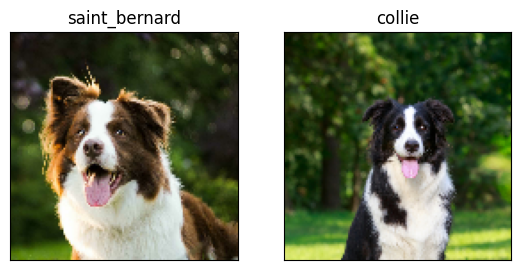

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i + 1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)